### Final annotation of Epithelial cells from oesophagus


Preprocessing:
- epithelial cells from main object subsetted, then subsetted cells from oesophagus
- performed scvi batch correction to prepare objects

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [43]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/post_scvi20221124/Oesophagus_epi.hvg5000_noRPL.scvi_output.with_annotv2.22021124.h5ad')

In [44]:
adata

AnnData object with n_obs × n_vars = 107693 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_sp

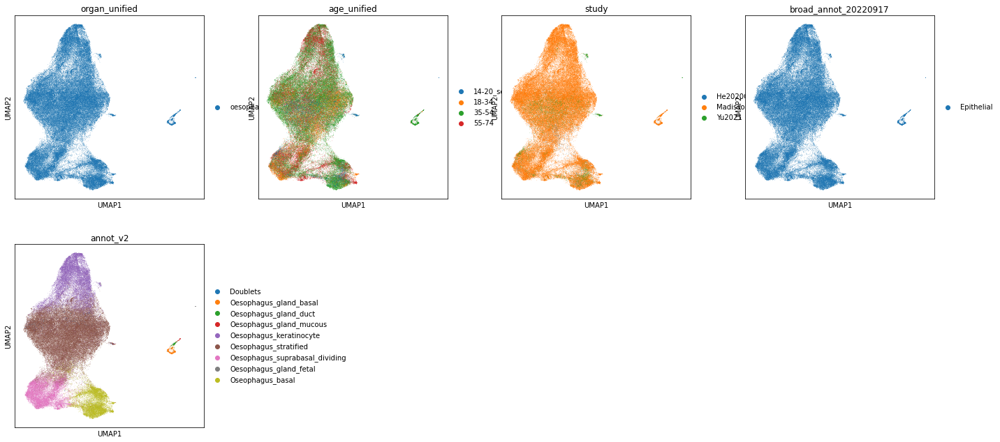

In [3]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata, color=['organ_unified', 'age_unified','study','broad_annot_20220917','annot_v2'])

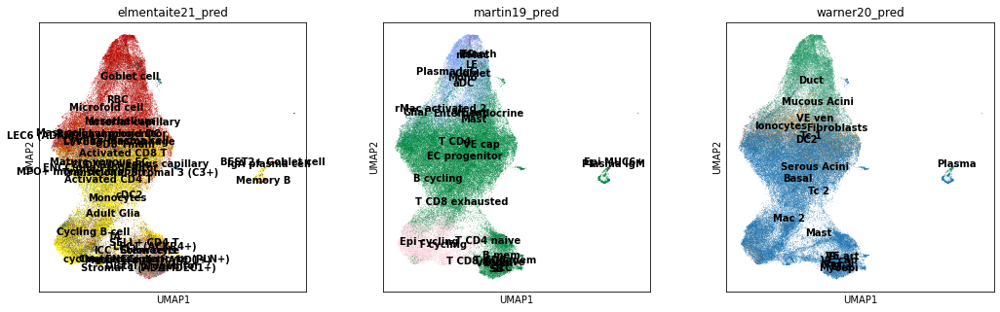

In [4]:
sc.pl.umap(adata, color=['elmentaite21_pred','martin19_pred','warner20_pred'],legend_loc='on data')

In [5]:
adata.X.max()

13444.0

In [5]:
#save raw counts in layers
adata.layers['counts'] = adata.X
#normalise and transform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

In [6]:
adata.X.max()

8.77789

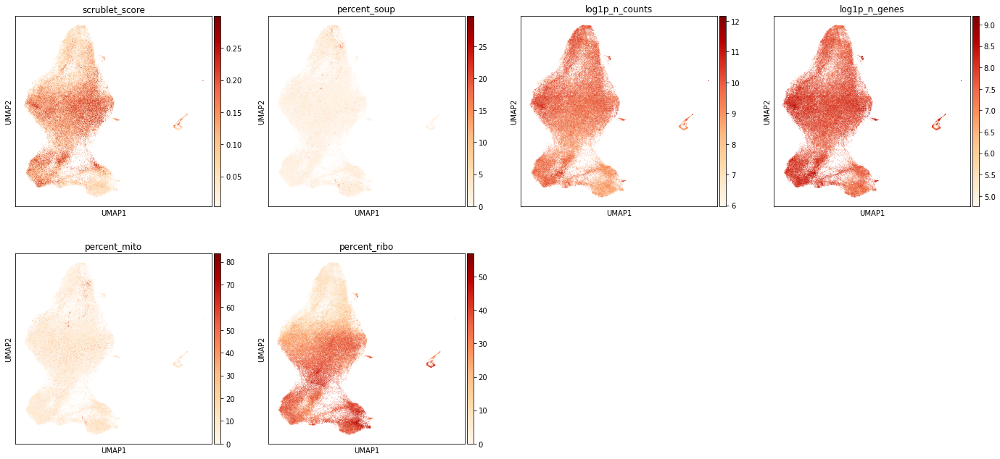

In [7]:
#plot some basic QC
sc.pl.umap(adata, color = ['scrublet_score','percent_soup','log1p_n_counts','log1p_n_genes','percent_mito','percent_ribo'],cmap='OrRd')

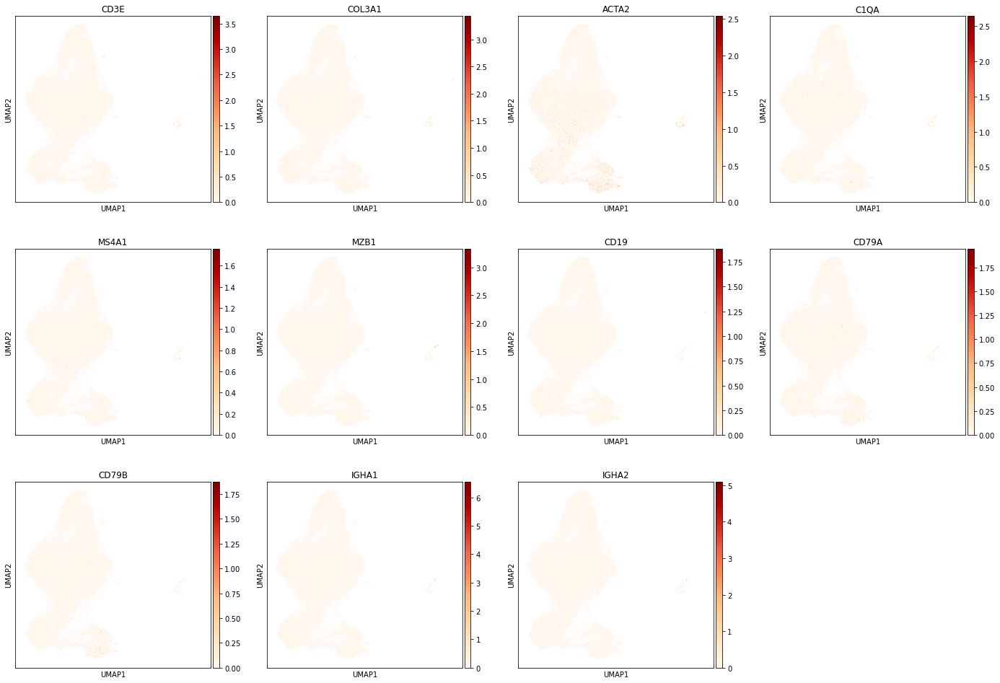

In [8]:
#plot doublet genes
sc.pl.umap(adata, color = ['CD3E','COL3A1','ACTA2','C1QA','MS4A1','MZB1','CD19','CD79A','CD79B','IGHA1','IGHA2'],cmap='OrRd')

In [9]:
#score cell cycle genes
cell_cycle_genes = ['MCM5',
'PCNA',
 'TYMS',
 'FEN1',
 'MCM2',
 'MCM4',
 'RRM1',
 'UNG',
 'GINS2',
 'MCM6',
 'CDCA7',
 'DTL',
 'PRIM1',
 'UHRF1',
 'MLF1IP',
 'HELLS',
 'RFC2',
 'RPA2',
 'NASP',
 'RAD51AP1',
 'GMNN',
 'WDR76',
 'SLBP',
 'CCNE2',
 'UBR7',
 'POLD3',
 'MSH2',
 'ATAD2',
 'RAD51',
 'RRM2',
 'CDC45',
 'CDC6',
 'EXO1',
 'TIPIN',
 'DSCC1',
 'BLM',
 'CASP8AP2',
 'USP1',
 'CLSPN',
 'POLA1',
 'CHAF1B',
 'BRIP1',
 'E2F8',
 'HMGB2',
 'CDK1',
 'NUSAP1',
 'UBE2C',
 'BIRC5',
 'TPX2',
 'TOP2A',
 'NDC80',
 'CKS2',
 'NUF2',
 'CKS1B',
 'MKI67',
 'TMPO',
 'CENPF',
 'TACC3',
 'FAM64A',
 'SMC4',
 'CCNB2',
 'CKAP2L',
 'CKAP2',
 'AURKB',
 'BUB1',
 'KIF11',
 'ANP32E',
 'TUBB4B',
 'GTSE1',
 'KIF20B',
 'HJURP',
 'CDCA3',
 'HN1',
 'CDC20',
 'TTK',
 'CDC25C',
 'KIF2C',
 'RANGAP1',
 'NCAPD2',
 'DLGAP5',
 'CDCA2',
 'CDCA8',
 'ECT2',
 'KIF23',
 'HMMR',
 'AURKA',
 'PSRC1',
 'ANLN',
 'LBR',
 'CKAP5',
 'CENPE',
 'CTCF',
 'NEK2',
 'G2E3',
 'GAS2L3',
 'CBX5',
 'CENPA']

In [10]:
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)
adata = adata[adata.obs.G2M_score.sort_values(ascending=True).index].copy()

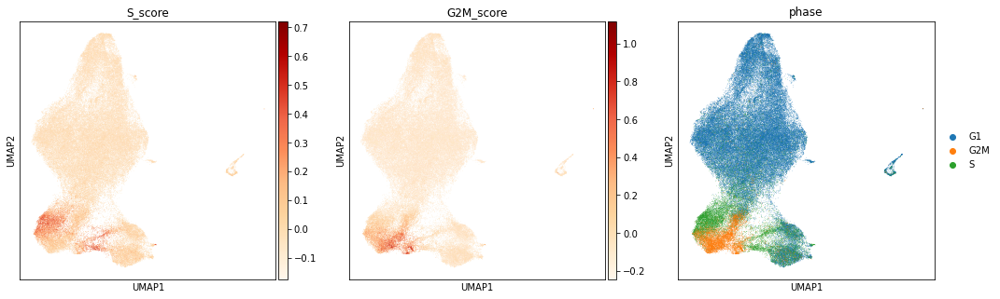

In [11]:
sc.pl.umap(adata,color=['S_score', 'G2M_score', 'phase'],cmap='OrRd')

In [12]:
sc.tl.leiden(adata, resolution = 1, neighbors_key="neighbors_scvi")

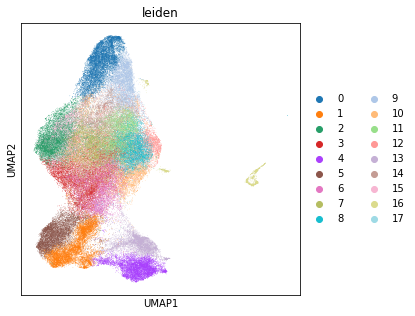

In [13]:
sc.pl.umap(adata,color='leiden')

In [14]:
sc.tl.leiden(adata, resolution = 0.5, neighbors_key="neighbors_scvi")

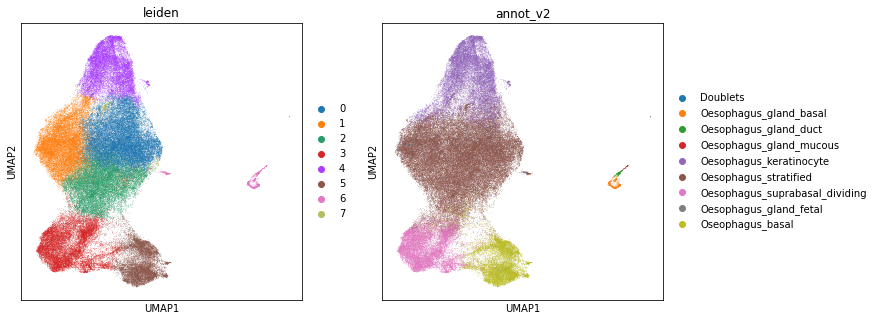

In [15]:
sc.pl.umap(adata,color=['leiden','annot_v2'])

In [25]:
import sys
sys.path.append("/home/jovyan/ao15/Megagut/")
from re5_combine import * 

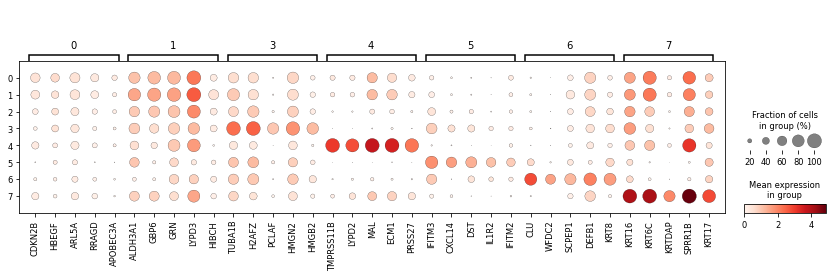

In [25]:
adata.raw = adata.copy()
mkst = calc_marker_stats(adata, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(adata, groupby='leiden', mks=mks)

In [21]:
pd.crosstab(adata.obs.annot_v2,adata.obs.leiden)

leiden,0,1,2,3,4,5,6,7
annot_v2,,,,,,,,
Doublets,272,193,29,32,35,65,26,0
Oesophagus_gland_basal,2,1,1,3,1,14,712,0
Oesophagus_gland_duct,0,0,0,0,1,1,219,0
Oesophagus_gland_mucous,0,0,0,0,1,0,83,0
Oesophagus_keratinocyte,3219,2478,142,0,14266,0,39,19
Oesophagus_stratified,21245,16544,17420,2304,380,297,179,373
Oesophagus_suprabasal_dividing,36,54,301,14274,6,160,2,1
Oesophagus_gland_fetal,0,0,0,0,0,2,15,0
Oseophagus_basal,3,7,405,1028,2,10786,15,0


In [27]:
new_cluster_names = [
    'Oesophagus_stratified','Oesophagus_stratified', #0,1
    'Oesophagus_stratified','Oesophagus_suprabasal_dividing', #2,3
    'Oesophagus_keratinocyte','Oesophagus_basal', #4,5
    'Oesophagus_gland','Unknown', #6,7

]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

adata.obs['annot_v3'] = [conv[x] for x in adata.obs['leiden']]

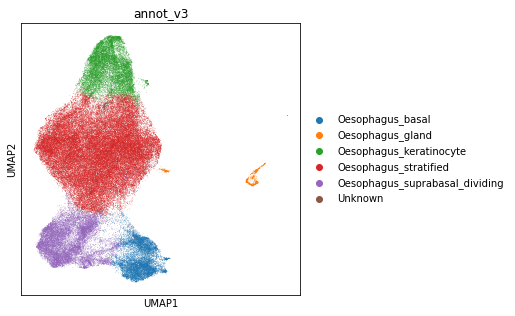

In [28]:
sc.pl.umap(adata,color='annot_v3')

In [69]:
pd.crosstab(adata.obs.donorID_unified,adata.obs.annot_v3)

annot_v3,Doublets,Oesophagus_basal,Oesophagus_gland,Oesophagus_keratinocyte,Oesophagus_stratified,Oesophagus_suprabasal_dividing,Unknown
donorID_unified,,,,,,,
D54,187,545,23,52,8920,3405,1
D55,2,3496,87,2270,14279,3981,16
D56,4,1616,438,3129,11497,1022,14
D57,2,987,20,2768,5535,1812,281
D58,2,1209,460,2767,10001,685,6
D59,1,644,14,1079,2964,1706,51
D60,0,1099,15,2460,5491,3926,23
D90,0,1006,28,4,2273,692,0
F26,0,155,89,55,391,78,0


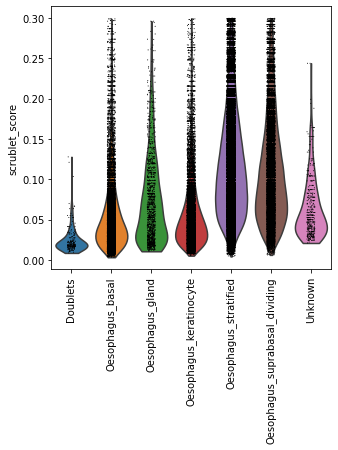

In [73]:
sc.pl.violin(adata,keys='scrublet_score',groupby='annot_v3',rotation=90)

Unsure why the unknown cluster is an outlier, look at similarity to other clusters below and probably group in with keratinocyte 

         Falling back to preprocessing with `sc.pp.pca` and default params.


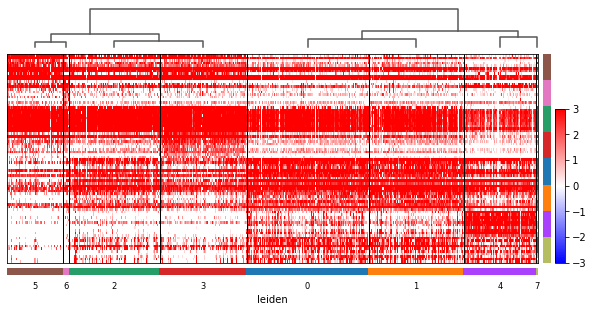

In [74]:
sc.tl.rank_genes_groups(adata,groupby='leiden',method='wilcoxon')
sc.tl.dendrogram(adata, groupby='leiden')
sc.pl.rank_genes_groups_heatmap(adata,groupby='leiden', n_genes=10, use_raw=False, swap_axes=True, show_gene_labels=False,
                                vmin=-3, vmax=3, cmap='bwr')

similar to 5 and 2/3 - name as stratified oesophagus

In [16]:
new_cluster_names = [
    'Oesophagus_stratified','Oesophagus_stratified', #0,1
    'Oesophagus_stratified','Oesophagus_suprabasal_dividing', #2,3
    'Oesophagus_keratinocyte','Oesophagus_basal', #4,5
    'Oesophagus_gland','Oesophagus_stratified', #6,7

]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

adata.obs['annot_v3'] = [conv[x] for x in adata.obs['leiden']]

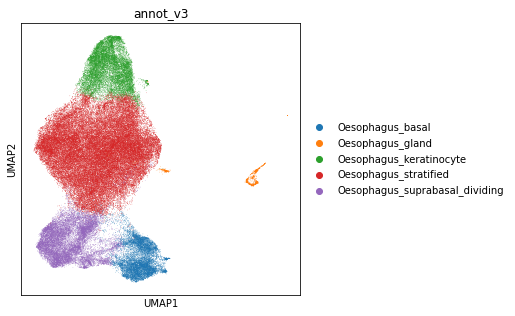

In [17]:
sc.pl.umap(adata,color='annot_v3')

In [18]:
basal = adata[adata.obs.annot_v3.isin(['Oesophagus_basal'])].copy()

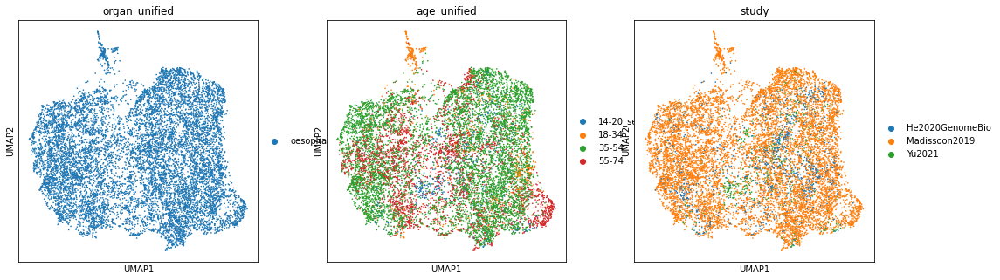

In [19]:
sc.pp.neighbors(
            basal,
            use_rep="X_scvi",
            n_pcs=basal.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(basal, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(basal, color=['organ_unified', 'age_unified','study'])

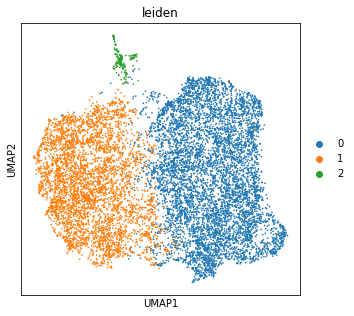

In [20]:
sc.tl.leiden(basal, resolution = 0.2, neighbors_key="neighbors_scvi")
sc.pl.umap(basal, color=['leiden'])

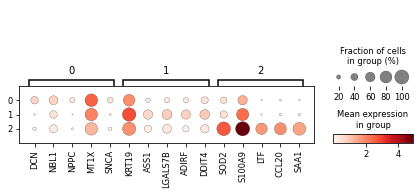

In [44]:
basal.raw = basal.copy()
mkst = calc_marker_stats(basal, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(basal, groupby='leiden', mks=mks)

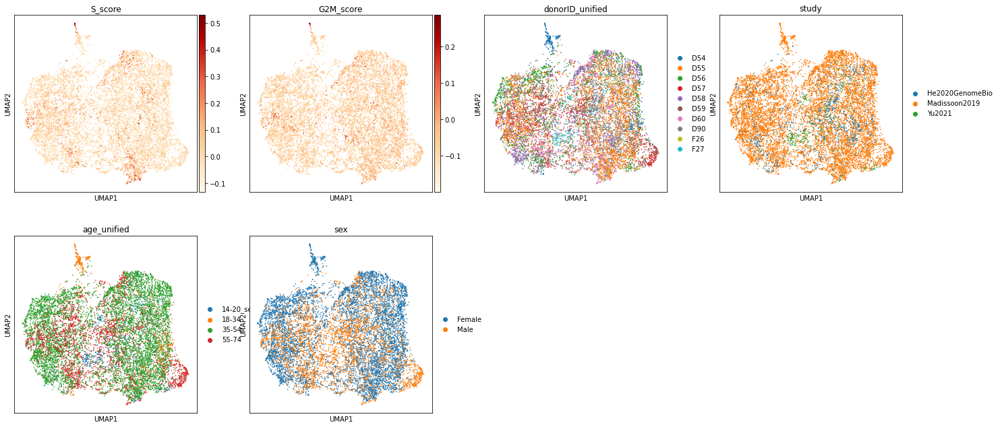

In [35]:
sc.pl.umap(basal,color=['S_score','G2M_score','donorID_unified','study','age_unified','sex'],cmap='OrRd')

In [21]:
#reannotate donor specific cluster as doublet to exclude, otherwise keep cluster naming - seems somewhat distinct but nothing super obvious gene wise
new_cluster_names = [
    'Oesophagus_basal','Oesophagus_basal', #0,1
    'Doublets',#2
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

basal.obs['annot_v3'] = [conv[x] for x in basal.obs['leiden']]

In [22]:
ON = {O:N for O,N in zip(basal.obs_names,basal.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]

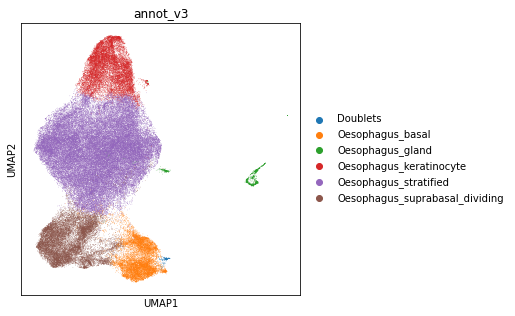

In [23]:
sc.pl.umap(adata,color='annot_v3')

In [5]:
supra = adata[adata.obs.annot_v3.isin(['Oesophagus_suprabasal_dividing'])].copy()

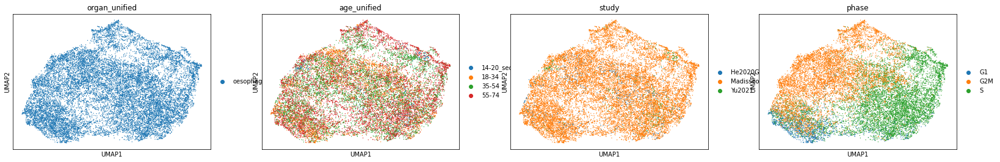

In [6]:
sc.pp.neighbors(
            supra,
            use_rep="X_scvi",
            n_pcs=supra.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(supra, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(supra, color=['organ_unified', 'age_unified','study','phase'])

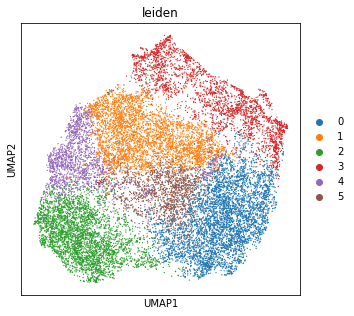

In [52]:
sc.tl.leiden(supra, resolution = 0.5, neighbors_key="neighbors_scvi")
sc.pl.umap(supra, color=['leiden'])

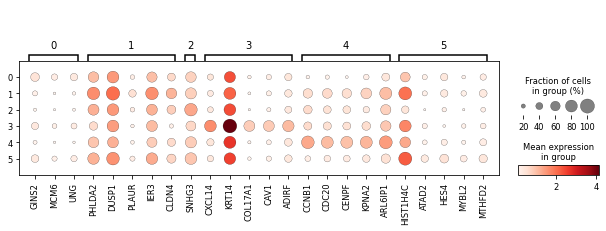

In [54]:
supra.raw = supra.copy()
mkst = calc_marker_stats(supra, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(supra, groupby='leiden', mks=mks)

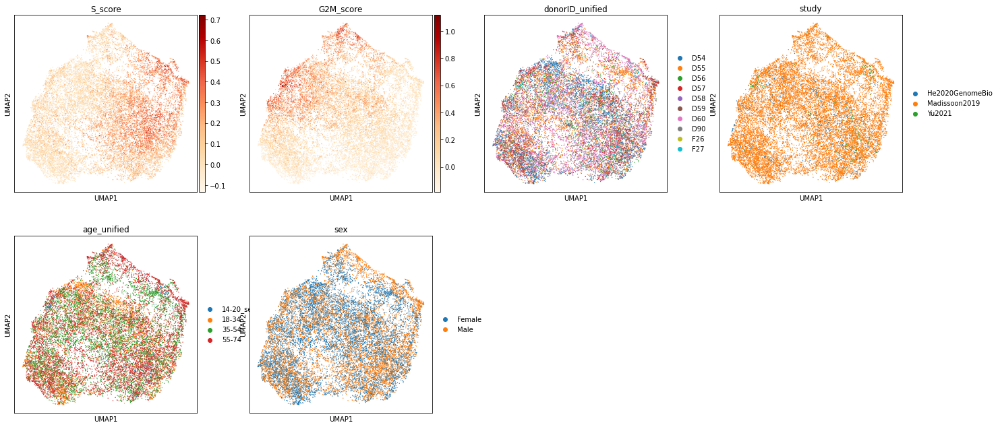

In [56]:
sc.pl.umap(supra,color=['S_score','G2M_score','donorID_unified','study','age_unified','sex'],cmap='OrRd')

no obvious heterogeneity - keep names as is
next try to cluster suprabasal AND basal

In [57]:
supra_basal = adata[adata.obs.annot_v3.isin(['Oesophagus_suprabasal_dividing','Oesophagus_basal'])].copy()

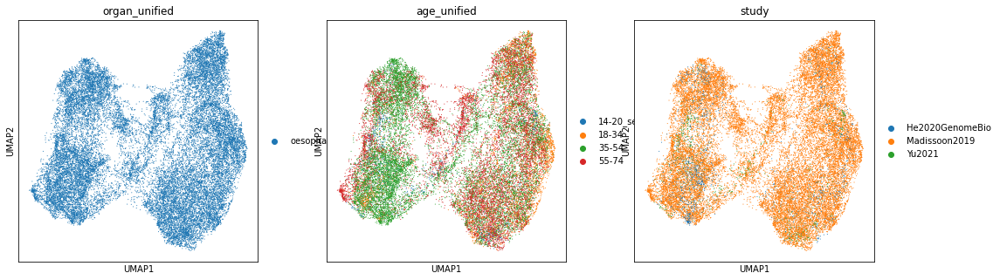

In [58]:
sc.pp.neighbors(
            supra_basal,
            use_rep="X_scvi",
            n_pcs=supra_basal.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(supra_basal, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(supra_basal, color=['organ_unified', 'age_unified','study'])

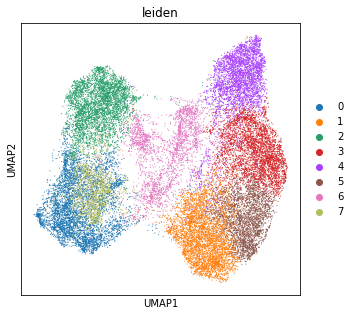

In [62]:
sc.tl.leiden(supra_basal, resolution = 0.7, neighbors_key="neighbors_scvi")
sc.pl.umap(supra_basal, color=['leiden'])

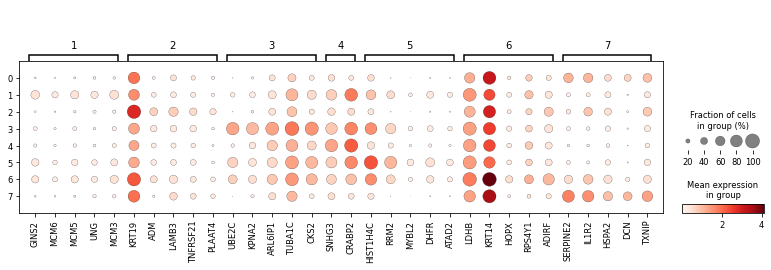

In [63]:
supra_basal.raw = supra_basal.copy()
mkst = calc_marker_stats(supra_basal, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(supra_basal, groupby='leiden', mks=mks)

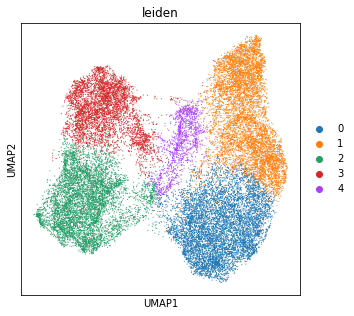

In [66]:
sc.tl.leiden(supra_basal, resolution = 0.3, neighbors_key="neighbors_scvi")
sc.pl.umap(supra_basal, color=['leiden'])

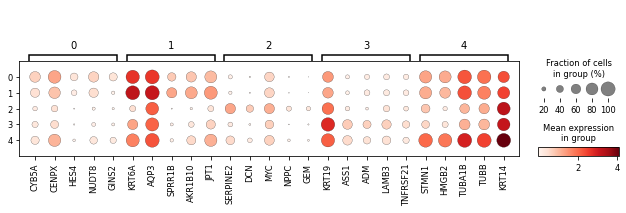

In [67]:
supra_basal.raw = supra_basal.copy()
mkst = calc_marker_stats(supra_basal, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(supra_basal, groupby='leiden', mks=mks)

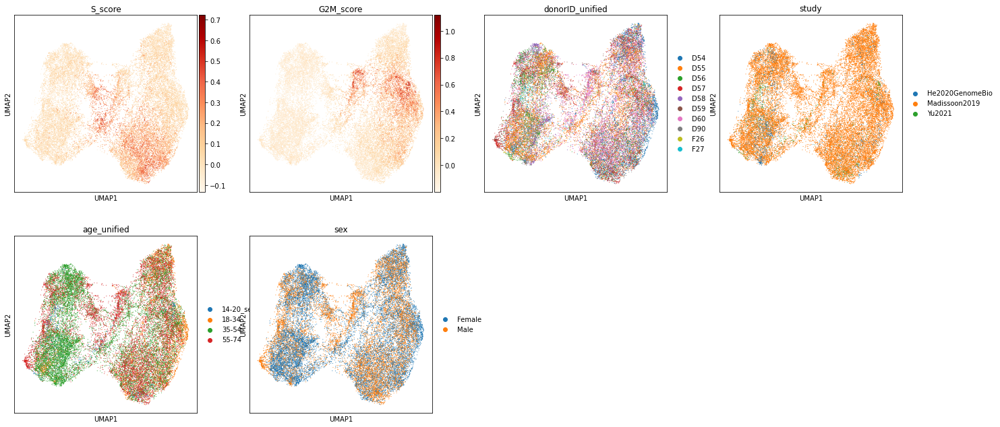

In [68]:
sc.pl.umap(supra_basal,color=['S_score','G2M_score','donorID_unified','study','age_unified','sex'],cmap='OrRd')

Keep annotations as they are

In [24]:
gland = adata[adata.obs.annot_v3.isin(['Oesophagus_gland'])].copy()

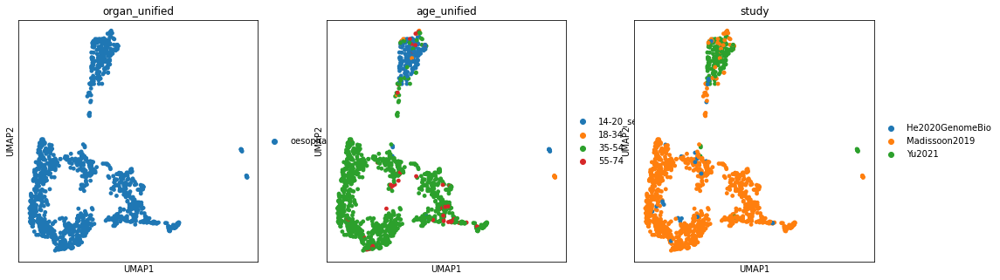

In [25]:
sc.pp.neighbors(
            gland,
            use_rep="X_scvi",
            n_pcs=gland.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(gland, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(gland, color=['organ_unified', 'age_unified','study'])

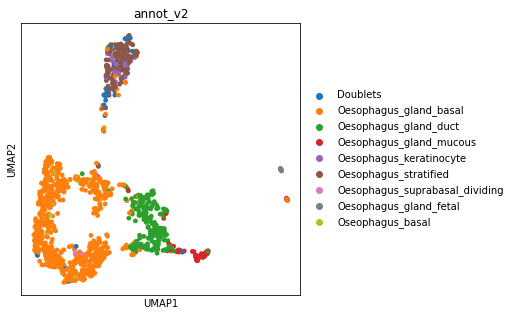

In [26]:
sc.pl.umap(gland,color='annot_v2')

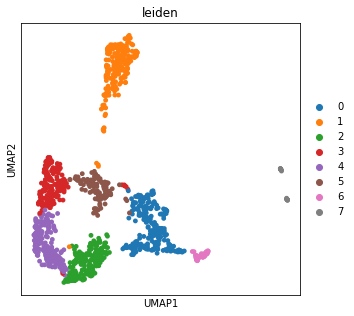

In [27]:
sc.tl.leiden(gland, resolution = 0.5, neighbors_key="neighbors_scvi")
sc.pl.umap(gland, color=['leiden'])

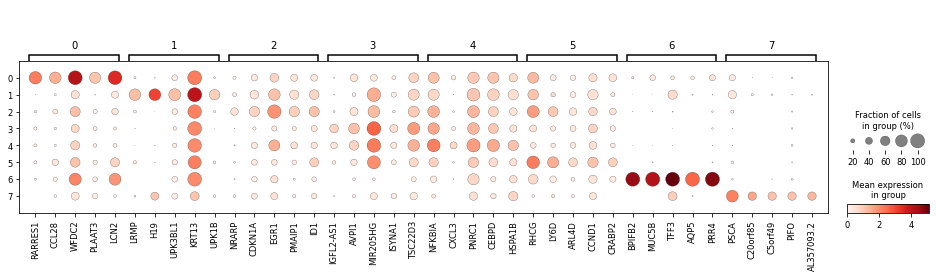

In [94]:
gland.raw = gland.copy()
mkst = calc_marker_stats(gland, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(gland, groupby='leiden', mks=mks)

In [103]:
gland.obs.leiden.value_counts()

0    254
1    248
2    205
3    194
4    189
5    119
6     53
7     28
Name: leiden, dtype: int64

In [92]:
pd.crosstab(gland.obs.annot_v2,gland.obs.leiden)

leiden,0,1,2,3,4,5,6
annot_v2,,,,,,,
Doublets,3,3,18,2,0,0,0
Oesophagus_gland_basal,367,18,15,199,111,0,2
Oesophagus_gland_duct,0,210,0,0,8,1,0
Oesophagus_gland_mucous,0,20,0,0,0,52,11
Oesophagus_keratinocyte,0,3,35,0,1,0,0
Oesophagus_stratified,0,0,178,0,1,0,0
Oesophagus_suprabasal_dividing,0,0,0,2,0,0,0
Oesophagus_gland_fetal,0,0,0,0,0,0,15
Oseophagus_basal,5,0,2,3,5,0,0


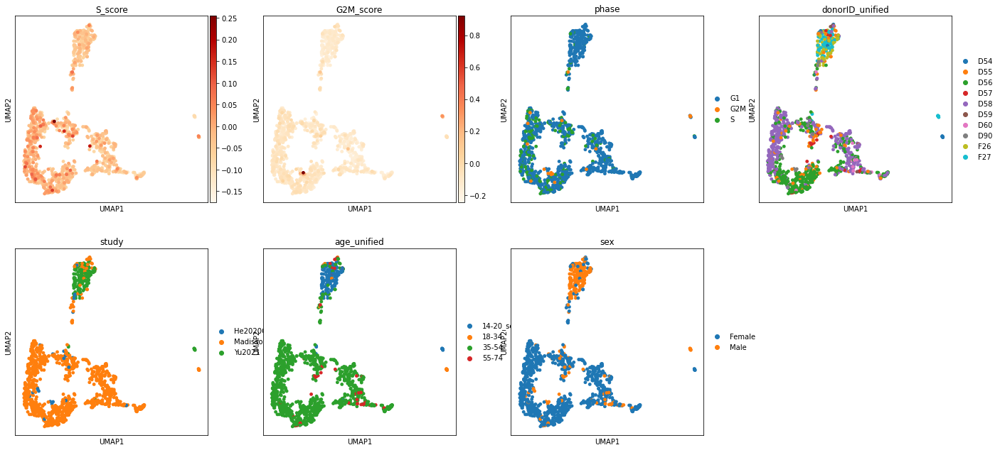

In [96]:
sc.pl.umap(gland,color=['S_score','G2M_score','phase','donorID_unified','study','age_unified','sex'],cmap='OrRd')

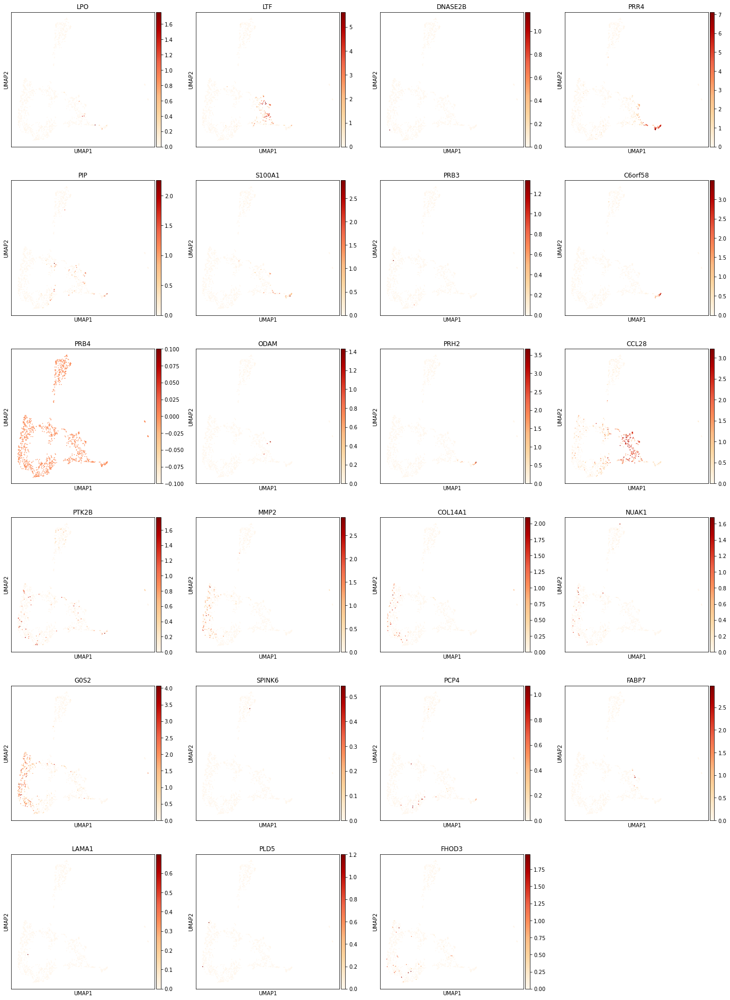

In [97]:
sc.pl.umap(gland, color=[
                         'LPO','LTF','DNASE2B','PRR4', 'PIP','S100A1', 'PRB3', 'C6orf58', 'PRB4', 'ODAM', 'PRH2','CCL28',#serous
                          'PTK2B', 'MMP2', 'COL14A1', 'NUAK1',"G0S2", #SMG basal
                         'SPINK6','PCP4','FABP7','LAMA1', 'PLD5',  'FHOD3', #myoepithelial
                         
                         
                         
                        ],color_map='OrRd',size=10)

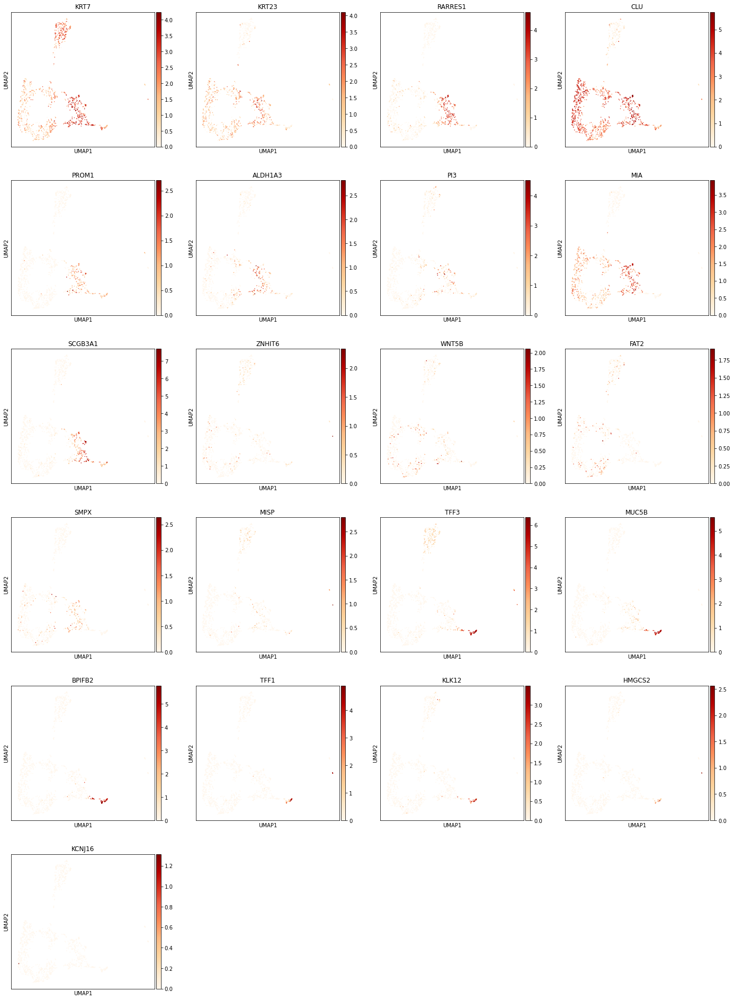

In [98]:
sc.pl.umap(gland, color=[
                         'KRT7','KRT23','RARRES1', 'CLU', 'PROM1','ALDH1A3', 'PI3', 'MIA','SCGB3A1', 'ZNHIT6','WNT5B','FAT2','SMPX','MISP',#duct cells
                         'TFF3','MUC5B', 'BPIFB2','TFF1','KLK12','HMGCS2','KCNJ16',#gland cells - mucous
                         
                         
                         
                        ],color_map='OrRd',size=10)

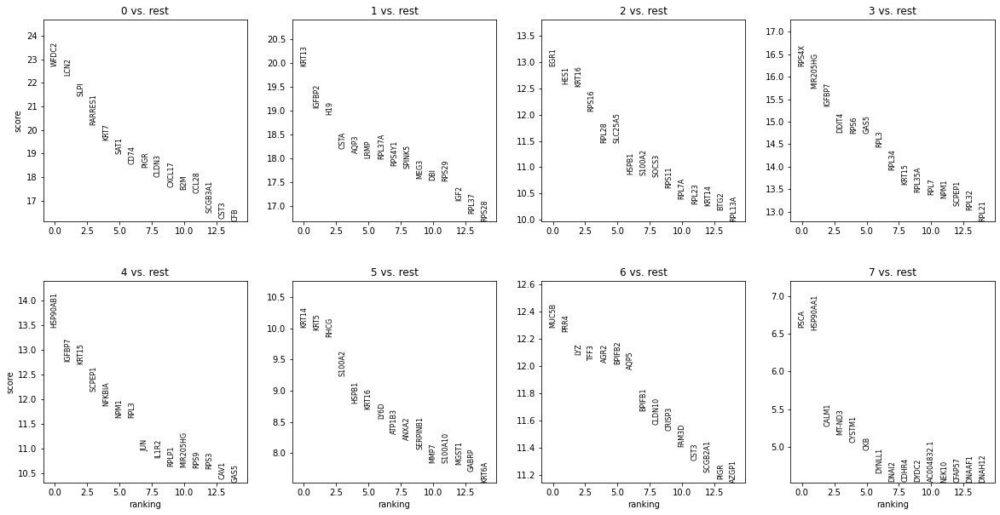

In [99]:
sc.tl.rank_genes_groups(gland, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(gland, n_genes=15, sharey=False)

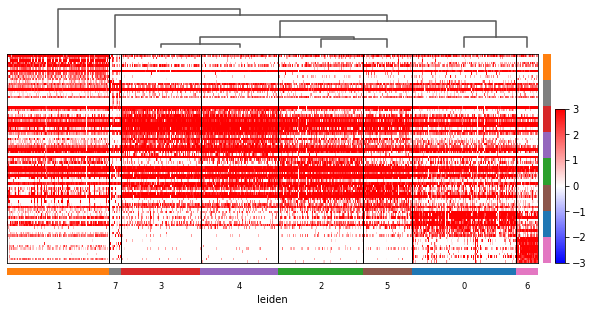

In [102]:
sc.tl.rank_genes_groups(gland,groupby='leiden',method='wilcoxon')
sc.tl.dendrogram(gland, groupby='leiden')
sc.pl.rank_genes_groups_heatmap(gland,groupby='leiden', n_genes=10, use_raw=False, swap_axes=True, show_gene_labels=False,
                                vmin=-3, vmax=3, cmap='bwr')

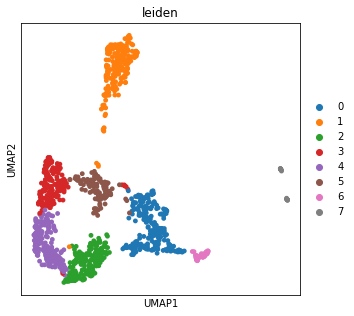

In [29]:
sc.pl.umap(gland,color='leiden')

In [42]:
#reannotate donor specific cluster as doublet to exclude, otherwise keep cluster naming - seems somewhat distinct but nothing super obvious gene wise
new_cluster_names = [
    'Oesophagus_gland_duct','Oesophagus_gland_fetal', #0,1
    'Oesophagus_gland_basal','Oesophagus_gland_basal',#2,3
    'Oesophagus_gland_basal','Oesophagus_gland_basal',#4,5
    'Oesophagus_gland_mucous','Oesophagus_gland_basal',#6,7
    
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

gland.obs['annot_v3'] = [conv[x] for x in gland.obs['leiden']]

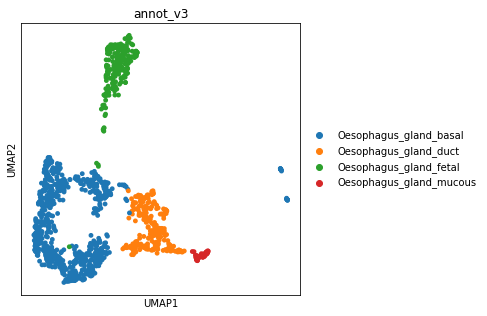

In [43]:
sc.pl.umap(gland,color='annot_v3')

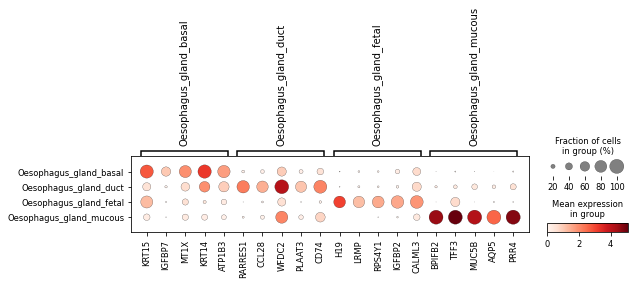

In [44]:
gland.raw = gland.copy()
mkst = calc_marker_stats(gland, groupby='annot_v3')
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(gland, groupby='annot_v3', mks=mks)

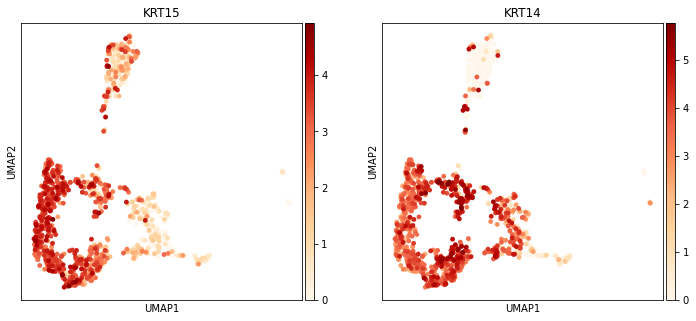

In [45]:
sc.pl.umap(gland,color=['KRT15','KRT14'],cmap='OrRd')

In [46]:
ON = {O:N for O,N in zip(gland.obs_names,gland.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]

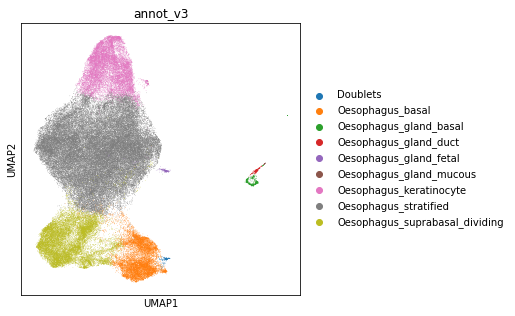

In [47]:
sc.pl.umap(adata,color='annot_v3')

In [48]:
KRT = adata[adata.obs.annot_v3.isin(['Oesophagus_keratinocyte'])].copy()

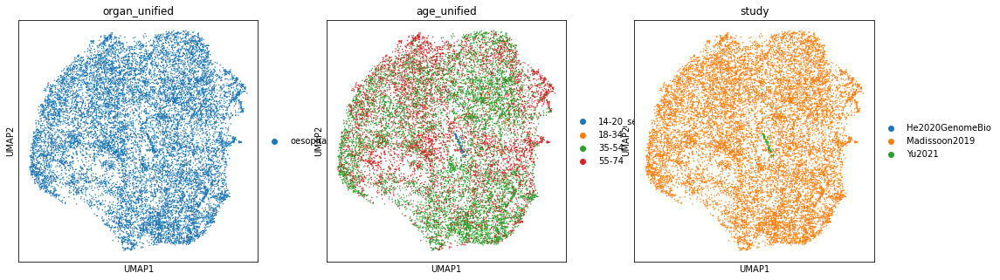

In [49]:
sc.pp.neighbors(
            KRT,
            use_rep="X_scvi",
            n_pcs=KRT.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(KRT, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(KRT, color=['organ_unified', 'age_unified','study'])

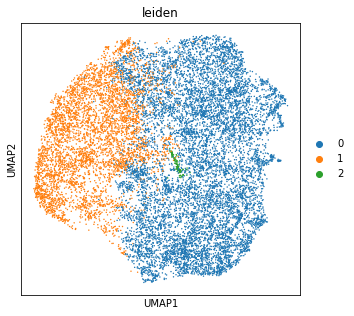

In [51]:
sc.tl.leiden(KRT, resolution = 0.2, neighbors_key="neighbors_scvi")
sc.pl.umap(KRT, color=['leiden'])

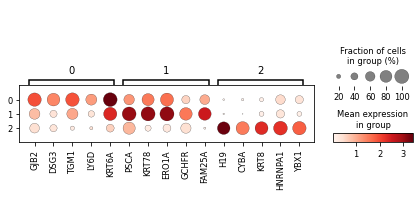

In [52]:
KRT.raw = KRT.copy()
mkst = calc_marker_stats(KRT, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(KRT, groupby='leiden', mks=mks)

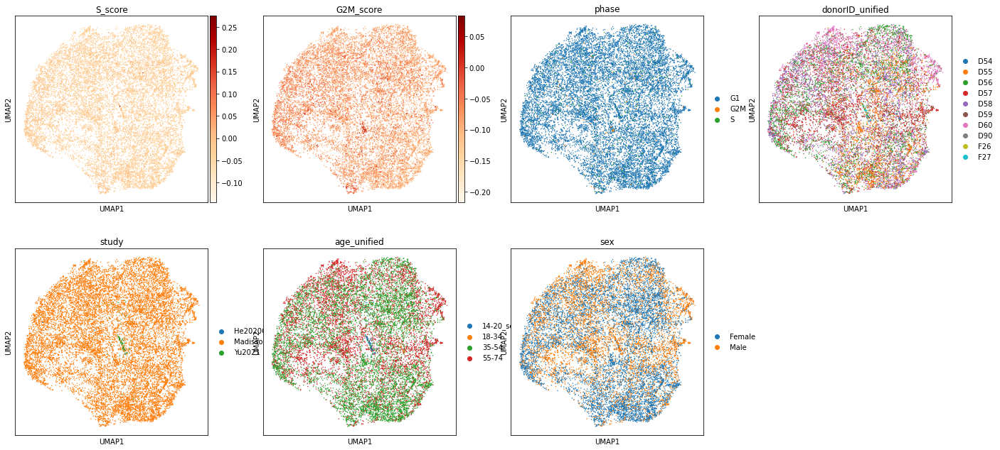

In [54]:
sc.pl.umap(KRT,color=['S_score','G2M_score','phase','donorID_unified','study','age_unified','sex'],cmap='OrRd')

In [56]:
#reannotate donor specific cluster as doublet to exclude, otherwise keep cluster naming - seems somewhat distinct but nothing super obvious gene wise
new_cluster_names = [
    'Oesophagus_keratinocyte','Oesophagus_keratinocyte', #0,1
    'Oesophagus_keratinocyte_fetal'#2
    
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

KRT.obs['annot_v3'] = [conv[x] for x in KRT.obs['leiden']]

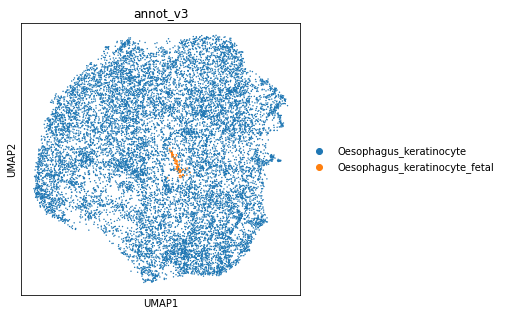

In [57]:
sc.pl.umap(KRT, color=['annot_v3'])

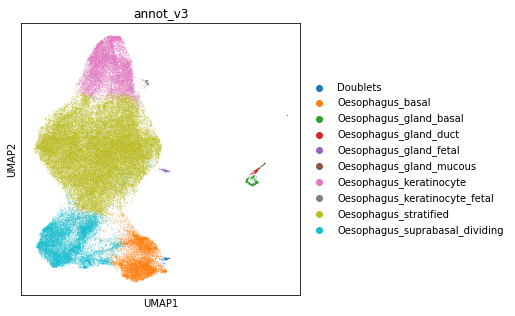

In [58]:
ON = {O:N for O,N in zip(KRT.obs_names,KRT.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]
sc.pl.umap(adata,color='annot_v3')

In [59]:
annot = adata.obs.loc[:,['annot_v2','annot_v3']]

In [60]:
annot.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/compartment_annotations/csv/Oes_epi_annot_v3.csv')

In [61]:
adata.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/Oesophagus_epi.hvg5000_noRPL.scvi_output.annotv3.22021127.h5ad')

In [62]:
adata_nodoublets = adata[~adata.obs.annot_v3.isin(['Doublets'])].copy()

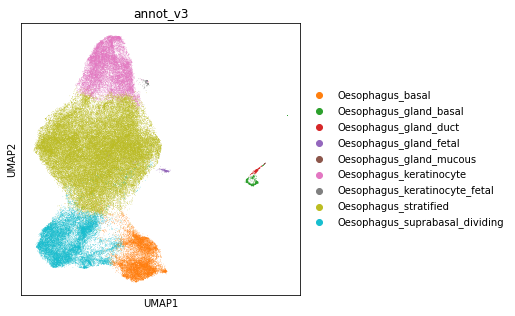

In [63]:
sc.pl.umap(adata_nodoublets,color='annot_v3')

In [64]:
adata_nodoublets.X.max()

8.77789

In [65]:
#recover raw
adata_nodoublets.X = adata_nodoublets.layers['counts']

In [66]:
adata_nodoublets.X.max()

13444.0

In [67]:
adata_nodoublets.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/pre_scvi20221124/no_doublets/Oesophagus_epi.raw.annotv3.nodoublets.22021127.h5ad')

In [2]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/Oesophagus_epi.hvg5000_noRPL.scvi_output.annotv3.22021127.h5ad')

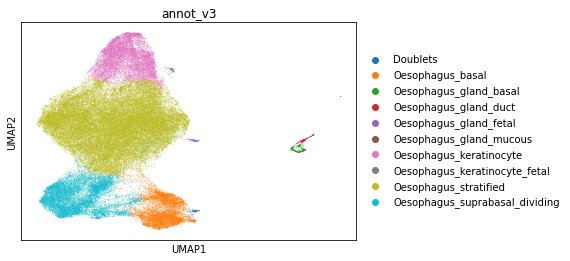

In [17]:
sc.pl.umap(adata,color=['annot_v3'])

In [8]:
adata.obs['leiden0.5'] = adata.obs.leiden

In [13]:
sc.tl.leiden(adata, resolution = 1, neighbors_key="neighbors_scvi")

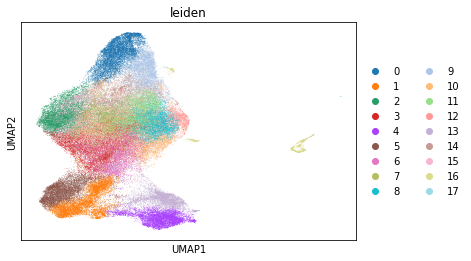

In [16]:
sc.pl.umap(adata,color='leiden')

In [15]:
pd.crosstab(adata.obs['leiden0.5'],adata.obs.leiden)

leiden,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
leiden0.5,,,,,,,,,,,,,,,,,,
0,0,7,380,510,0,7,331,3565,5827,1336,502,5679,3363,0,3097,162,11,0
1,210,8,8213,1911,0,8,120,1486,26,25,1881,115,1029,0,541,3694,10,0
2,0,107,19,5192,8,106,6273,1398,496,3,3610,147,613,94,91,134,7,0
3,0,8954,3,227,567,7123,98,15,27,0,17,0,62,544,1,1,2,0
4,9145,1,1,0,0,0,0,0,4,4955,201,1,53,0,191,16,124,0
5,0,12,0,19,6841,17,78,0,1,0,8,0,0,4348,0,0,1,0
6,0,0,0,0,2,0,1,9,0,0,0,0,0,0,0,0,1264,14
7,0,0,0,0,0,0,0,0,0,0,0,0,196,0,197,0,0,0


In [18]:
cycling = adata[adata.obs['annot_v3'].isin(['Oesophagus_suprabasal_dividing'])]

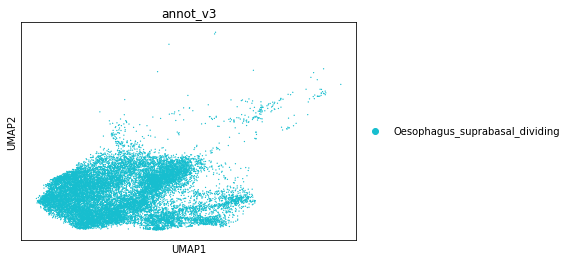

In [21]:
sc.pl.umap(cycling,color='annot_v3')

In [23]:
sc.tl.leiden(cycling, resolution = 0.2, neighbors_key="neighbors_scvi")

/home/jovyan/my-conda-envs/standard/lib/python3.8/site-packages/scanpy/tools/_leiden.py:158: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_added] = pd.Categorical(


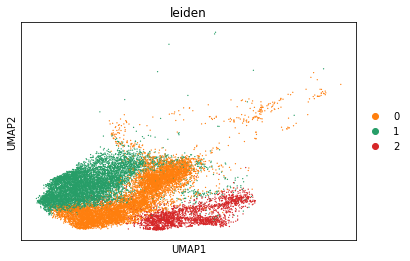

In [24]:
sc.pl.umap(cycling,color='leiden')

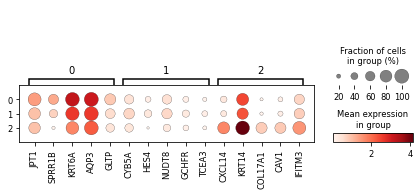

In [26]:
cycling.raw = cycling.copy()
mkst = calc_marker_stats(cycling, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(cycling, groupby='leiden', mks=mks)

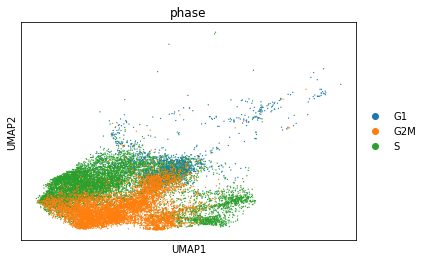

In [27]:
sc.pl.umap(cycling,color='phase')

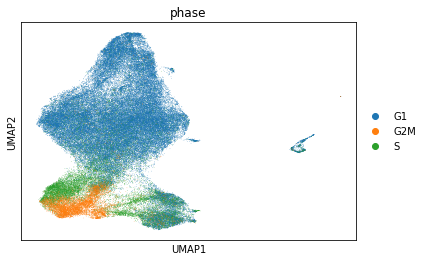

In [28]:
sc.pl.umap(adata,color='phase')

In [29]:
#reannotate donor specific cluster as doublet to exclude, otherwise keep cluster naming - seems somewhat distinct but nothing super obvious gene wise
new_cluster_names = [
    'Oesophagus_cycling_G2M','Oesophagus_cycling_S', #0,1
    'Oesophagus_basal_cycling'#2
    
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

cycling.obs['annot_v3'] = [conv[x] for x in cycling.obs['leiden']]

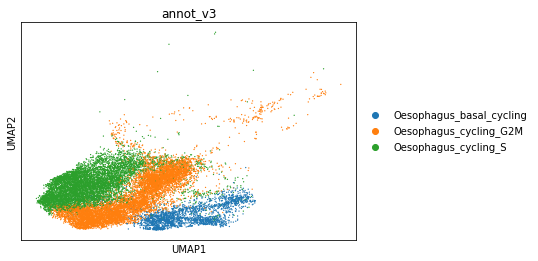

In [30]:
sc.pl.umap(cycling,color='annot_v3')

In [31]:
ON = {O:N for O,N in zip(cycling.obs_names,cycling.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]

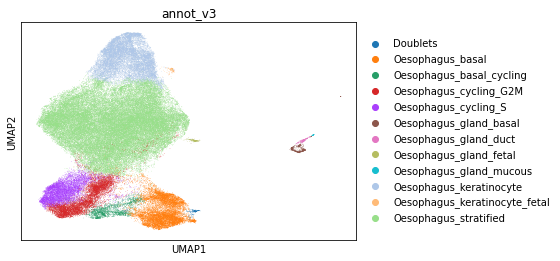

In [32]:
sc.pl.umap(adata,color='annot_v3')

In [34]:
adata.obs['annot_v3'] = (
    adata.obs["annot_v3"]
    .map(lambda x: {'Oesophagus_keratinocyte':'Oral_keratinocyte_outer'}.get(x, x))
    .astype("category")
)

In [49]:
annot = adata.obs.loc[:,['annot_v2','annot_v3']]

In [50]:
annot

,annot_v2,annot_v3
index,,
TTCTACACATACGCCG-ERR4161479,Oesophagus_gland_mucous,Oesophagus_gland_mucous
TTCTCCTCAACGATGG-ERR4161427,Oesophagus_gland_duct,Oesophagus_gland_duct
TTCGAAGGTAAGCACG-ERR4161479,Oesophagus_gland_duct,Oesophagus_gland_duct
TCAATCTAGGTGTGGT-ERR4161427,Oesophagus_gland_duct,Oesophagus_gland_duct
CCGGTAGGTCCTAGCG-ERR4161445,Oesophagus_gland_mucous,Oesophagus_gland_duct
...,...,...
TGCACCTGTGCCTTGG-HT-231_esophagus,Oesophagus_suprabasal_dividing,Oesophagus_cycling_G2M
ACACCGGCACAGCCCA-HT-231_esophagus,Oesophagus_suprabasal_dividing,Oesophagus_cycling_G2M
CGCGTTTGTCTGGAGA-HT-232_esophagus,Oesophagus_suprabasal_dividing,Oesophagus_basal_cycling


In [51]:
annot.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/compartment_annotations/csv/Oes_epi_annot_v3.csv')

In [37]:
adata.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/Oesophagus_epi.hvg5000_noRPL.scvi_output.annotv3.22021206.h5ad')

In [38]:
adata_nodoublets = adata[~adata.obs.annot_v3.isin(['Doublets'])].copy()

In [39]:
#recover raw
adata_nodoublets.X = adata_nodoublets.layers['counts']

In [40]:
adata_nodoublets.X.max()

13444.0

In [41]:
adata_nodoublets.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/pre_scvi20221124/no_doublets/Oesophagus_epi.raw.annotv3.nodoublets.22021206.h5ad')

In [45]:
bdata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/Oesophagus_epi.hvg5000_noRPL.scvi_output.annotv3.22021206.h5ad')

In [46]:
bdata

AnnData object with n_obs × n_vars = 107693 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_sp

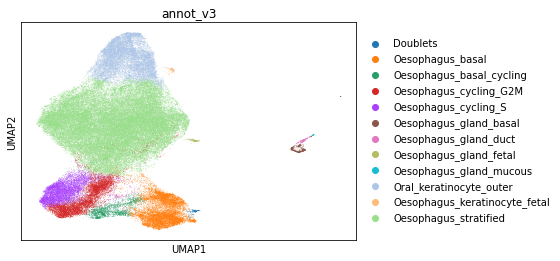

In [48]:
sc.pl.umap(bdata,color='annot_v3')

In [2]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/Oesophagus_epi.hvg5000_noRPL.scvi_output.annotv3.22021206.h5ad')

In [3]:
adata.obs['annot_v3'] = (
    adata.obs["annot_v3"]
    .map(lambda x: {'Oesophagus_stratified':'Oral_keratinocyte_stratified'}.get(x, x))
    .astype("category")
)

In [4]:
annot = adata.obs.loc[:,['annot_v2','annot_v3']]

In [5]:
annot.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/compartment_annotations/csv/Oes_epi_annot_v3.csv')

In [6]:
adata.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/Oesophagus_epi.hvg5000_noRPL.scvi_output.annotv3.22021206.h5ad')

In [7]:
adata_nodoublets = adata[~adata.obs.annot_v3.isin(['Doublets'])].copy()

In [8]:
#recover raw
adata_nodoublets.X = adata_nodoublets.layers['counts']

In [9]:
adata_nodoublets.X.max()

13444.0

In [10]:
adata_nodoublets.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/pre_scvi20221124/no_doublets/Oesophagus_epi.raw.annotv3.nodoublets.22021206.h5ad')

## Plot figures

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/no_doublets/Oesophagus_epi.hvg5000_noRPL.scvi_output.annotv3.nodoublets.22021208.h5ad')

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


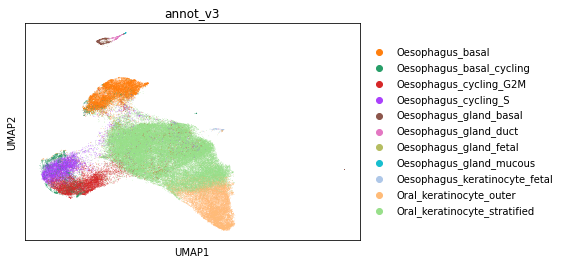

In [3]:
sc.pl.umap(adata,color='annot_v3')

In [4]:
adata.obs['fine_annot'] = adata.obs["annot_v3"].str.replace("Oesophagus_","")


In [5]:
adata.obs['fine_annot'] = adata.obs["fine_annot"].str.replace("Oral_","")

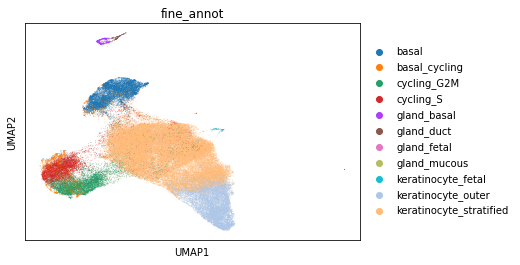

In [6]:
sc.pl.umap(adata,color='fine_annot')

In [7]:
list(adata.obs.fine_annot.unique())

['gland_mucous',
 'gland_duct',
 'keratinocyte_fetal',
 'keratinocyte_stratified',
 'keratinocyte_outer',
 'gland_basal',
 'gland_fetal',
 'basal',
 'cycling_G2M',
 'cycling_S',
 'basal_cycling']

In [8]:
adata.obs['fine_annot'] = (
    adata.obs["fine_annot"]
    .map(lambda x: {'gland_mucous':'Gland_mucous',
 'gland_duct':'Gland_duct',
 'keratinocyte_fetal':'Keratinocyte_fetal',
 'keratinocyte_stratified':'Keratinocyte_stratified',
 'keratinocyte_outer':'Keratinocyte_outer',
 'gland_basal':'Gland_basal',
 'gland_fetal':'Gland_fetal',
 'basal':'Basal',
 'cycling_G2M':'Cycling_G2M',
 'cycling_S':'Cycling_S',
 'basal_cycling':'Basal_cycling'
        
         }.get(x, x))
    .astype("category")
)

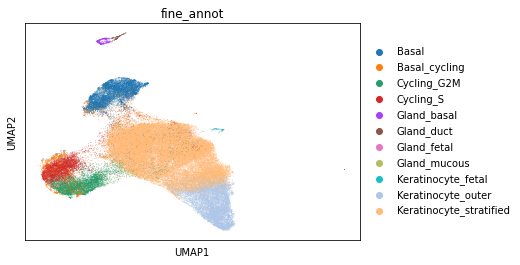

In [9]:
sc.pl.umap(adata,color='fine_annot')

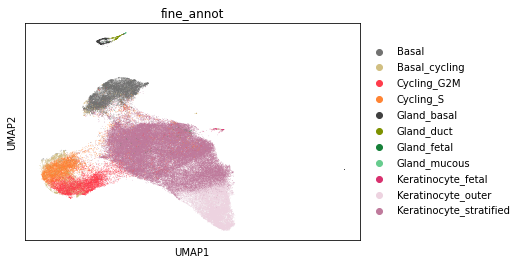

In [10]:
sc.pl.umap(adata,color='fine_annot',palette = [
    '#727271',#'Basal',
    '#d1bf82',#Basal_cycling
    '#ff3c4b',#'Cycling_G2M', 
    '#ff8433',#'Cycling_S',
      '#404040',#Gland_basal
    '#7D9100',#'Duct',
    '#168039',#Gland_fetal
    
    '#67cc8e',#'Mucous',
    
    '#d8306e',#'Keratinocyte_fetal',
    '#EDD3E0',#'Keratinocyte_stratified',
    '#BF7A9C',#'Keratinocyte_outer',
    
  
    
    
     
    
    
    
    
                                  
                                              ])

In [11]:
#save raw counts in layers
adata.layers['counts'] = adata.X
#normalise and transform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

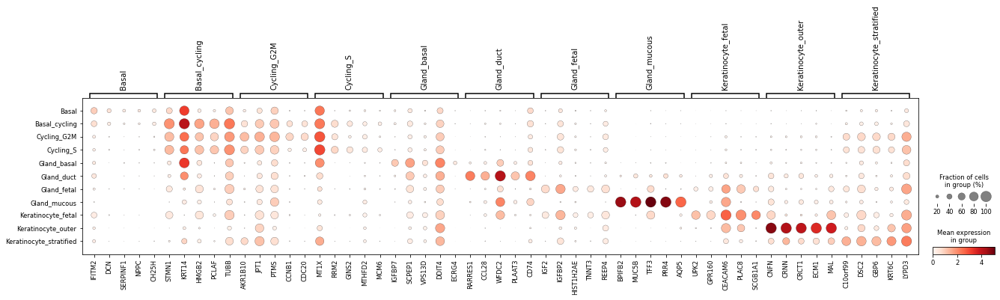

In [12]:
import sys
sys.path.append("/home/jovyan/ao15/Megagut/")
from re5_combine import *
adata.raw = adata.copy()
mkst = calc_marker_stats(adata, groupby="fine_annot")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(adata, groupby='fine_annot', mks=mks)

In [13]:
marker_genes_dict = {'Basal':['KRT15','CXCL14','COL17A1','IFITM2','DCN','SERPINF1','NPPC'],
                     'Cycling_G2M':['CCNB1','CENPF','CDC20','CKS2'],
                     'Cycling_S':['PCNA','DUT','MCM3','HELLS','SLBP'],
                     'Gland_basal':['IGFBP7','SCPEP1','ECRG4'],
                     'Gland_duct':['RARRES1','ALDH1A3','CCL28','CD74'],
                     'Fetal markers':['IGF2','IGFBP2','TNNT3','UPK2','GPR160','SCGB1A1'],
                     'Gland_mucous':['TFF3','MUC5B','BPIFB2','AQP5','PRR4'],
                     'Keratinocyte_outer':['CRNN','CNFN','TGM3','SPRR3','SBSN','CRCT1'],
                     'Keratinocyte_stratified':['DSG1','KRT6C','LY6D','KRT16']
}

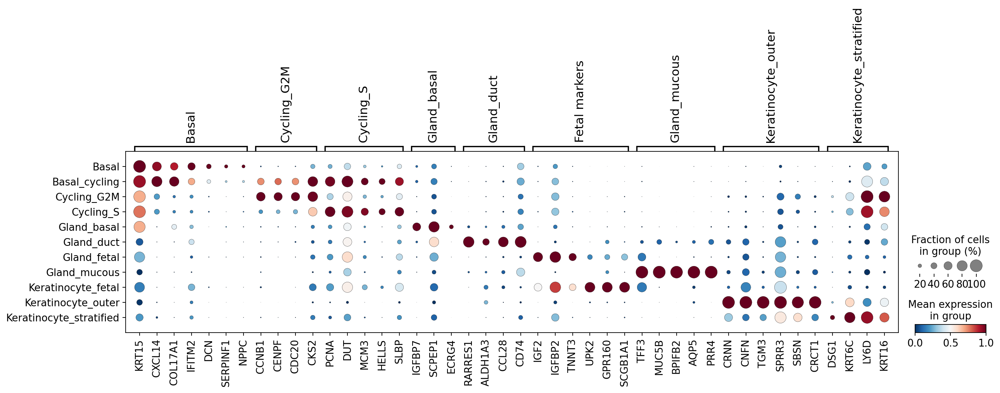

In [14]:
sc.set_figure_params(dpi_save = 300)
sc.pl.dotplot(adata,var_names=marker_genes_dict,groupby='fine_annot',save='Epi_oesophagus_markers.png',color_map='RdBu_r', standard_scale='var')

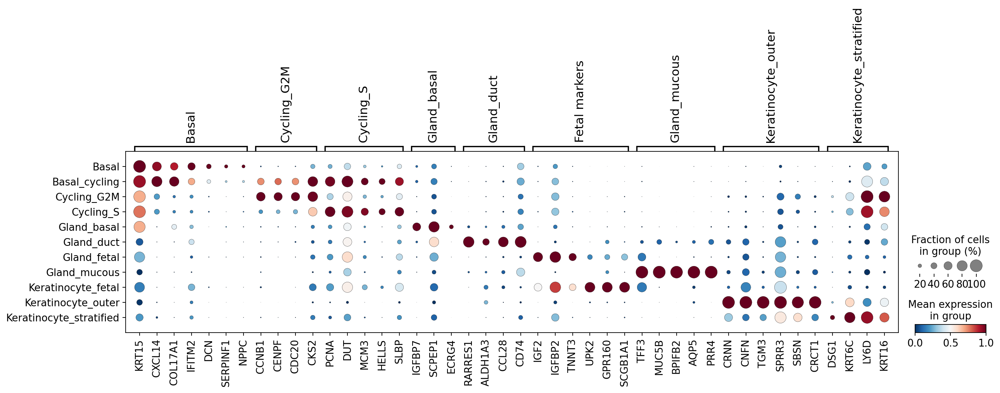

In [15]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
sc.pl.dotplot(adata,var_names=marker_genes_dict,groupby='fine_annot',save='Epi_oesophagus_markers.pdf',color_map='RdBu_r', standard_scale='var')

In [16]:
#make some plots for paper figures

In [17]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
plt.rcParams['figure.figsize'] = [5,5]
sc.set_figure_params(dpi=300,dpi_save=600)

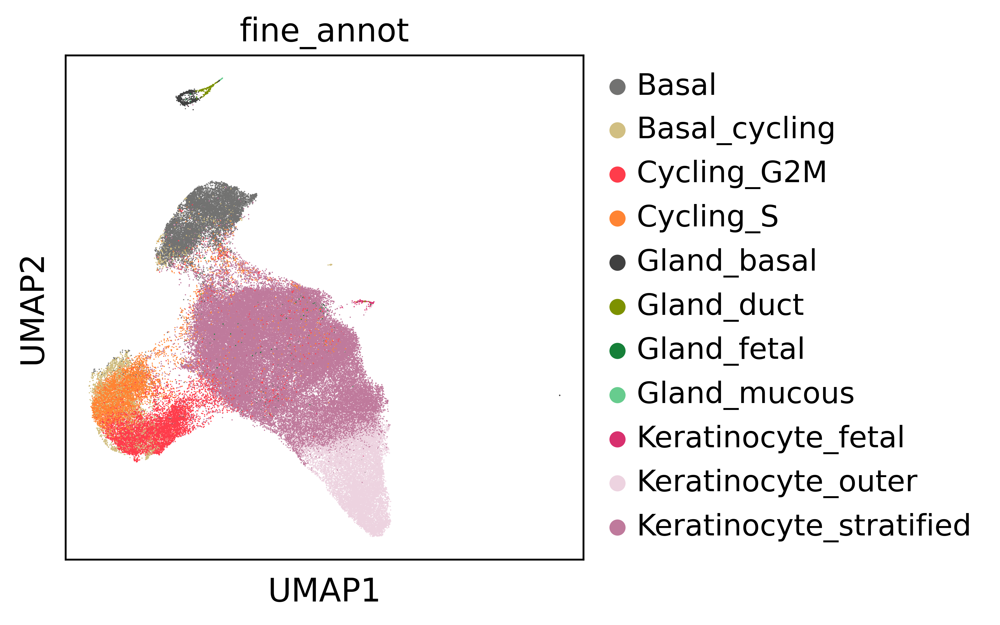

In [18]:
sc.pl.umap(adata,color='fine_annot',save='oesophagus_epi_annot.png')

<AxesSubplot: title={'center': 'fine_annot'}, xlabel='UMAP1', ylabel='UMAP2'>

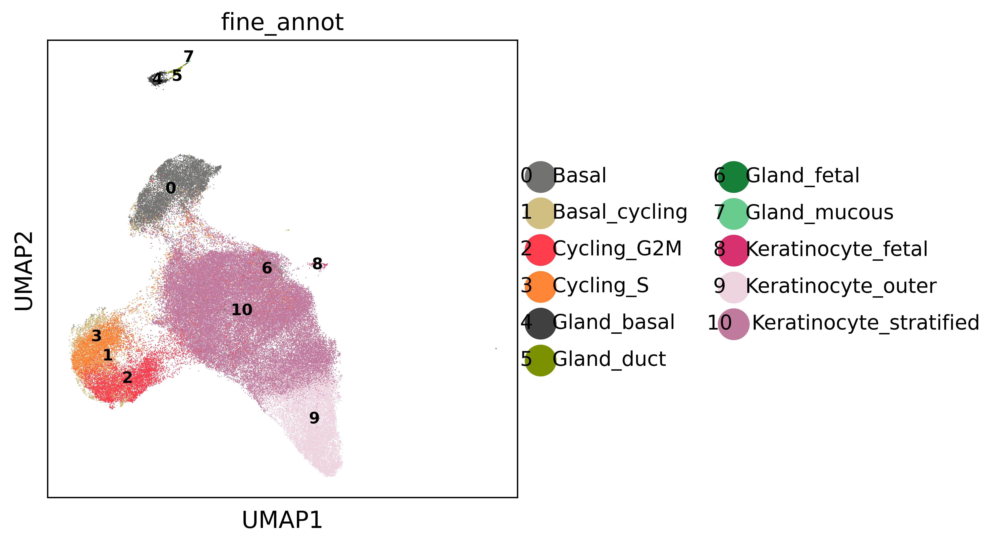

In [19]:
import sctk as sk
sk.plot_embedding(
    adata,
    basis="umap",
    groupby="fine_annot",
    figsize=(5, 5),
    save='figures/oesophagus_epi_annot.png')